## Reinforcemnet Learning(RL)

In reinforcement learning we wanna learn optimal actions in an environment based on the rewards we get, and be able to reach to an optimal policy to reach to a maximum reward at the end.<br>
Still we consider that our model is Markov, which means that we assume that our transition model is only based on our current state, which means that the next step only depends on the current state and what action you take and it is a function of these two parameters.($P(s'|s, a)$). Like MDP we have sets of actions and states which can be known or unknown, and a transition function and a reward function.<br>
But the difference with the MDP is that we do not haave the reward and transition function, i.e., we don't know which states are good or what the actions do, must actually try actions and states out to learn

<br>

So we have an **agent** which should learn from the environment. This agent has right to do some **actions** and as the result of it's actions, it receives **reward** from the environment it is in it(not necessarily always positive), and the action that agent does also have an effect on the environment which would take the agent to a **new state**.

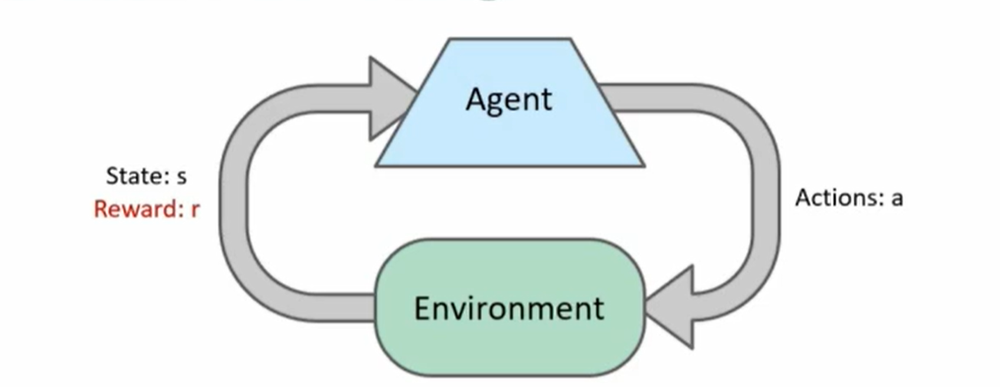
<center>Figure 1: RL idea, Adopte from [1]</center>

**Basic Idea**:
+ Receives feedback in the form of **rewards**
+ Agent's utility is defined by the reward function(Utility is equal to weighted sum of rewards)
+ Must (learn to) act so as to **maximize expected rewards**.
+ All learning is basd on observed samples of outcomes!

We can say that MDP approach was an **offline** approach and RL is an  **Online** approach. Which is because that in MDP we have transition and reward models(or functions), but we should learn it in RL.


> In RL, one action does not have any reward by itself, there should be a sequence of actions that leads to a change of a state. This is called delayed reward.

> The thing is in RL we cannot learn or do good with only one experience. We shouold have multiple experience. And the thing we calculate at the end is the expectation($E$)


**Overview**:

+ Passive RL (=how to learn from experience)(In passive our agent is not active in experiences, we give it bunch of experience and we tell it to learn based on the given experiences. It does not decide to experience what.)
    + Model-based Passive RL(we have a model and we learn the parameters of that model)
        + Learn the MDP model from experiences, then solve the MDP. The calculation orders is $O(2S^2A)$
    + Model-free Passive RL(we don't look for something like T or R. Directly we learn that which action is better),(Instead of directly calculating Value of state which consist of T and R functions, We would directly **estimate**, istead of first estimating T and R functiosn and then find the Value or V, we would directly just estimate the Value or V)
        + Forego learning the MDP model, directly learn $V$ or $Q$:
            + Value-learning - learns value of a fixed policy; 2 approaches: Direct Evaluation & TD Learning. The calculation order is $O(S)$
            + Q Learning - learns Q values of the optimal policy (uses Q version of TD Learning). The calculation order is $O(SA)$

+ Active RL (= agent also needs to decide how to collect experiences.)(We decide based on our current state. Here the question is what we should experience)
    + Key challenges:
        + How to efficiently explore?
        + How to trade off **exploration** and **exploitation**.
    + Applied to both model-based and model-free

+ Approximate RL(= to handle large state spaces)
    + Approximate Q-Learning
    + Policy Search

### Passive Model-Based RL

+ Model-Based Idea:<br>
    Learn an approximate model based on experiences.<br>
    Solve for values as if the learned model were correct<br>

+ Step 1: Learn empirical MDP model<br>
    Count outcomes $s'$ for each $s, a$.<br>
    Normalize to give an estimate of $\bar{T}(s, a, s')$<br>
    Discover each $\hat{R}(s, a, s')$ when experience $(s, a, s')$

+ Step 2: Solve the learned MDP<br>
    For example use value iteration as before.

Example(model-based passive RL):

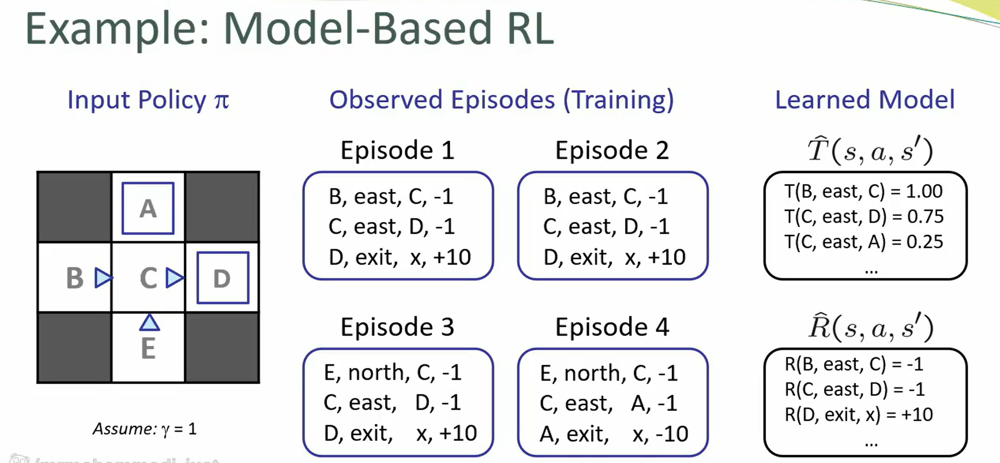
<center>Figure 2: Example of model-based passive RL, Adopted from [1]</center>
<br>


### Passive Model-Free RL

+ Simplified Task: Policy evaluation<br>
    + Input: a fixed policy $\pi(s)$<br>
    + We don't know the transitions $T(s, a, s')$<br>
    + We don't know the rewards $R(s, a, s')$
    + Goal: Learn the **state values**

+ In this case:
    + No choice about what actions to take
    + Just execute the policy and learn from experience
    + This is NOT offline planning! We actually take actions in the world. 

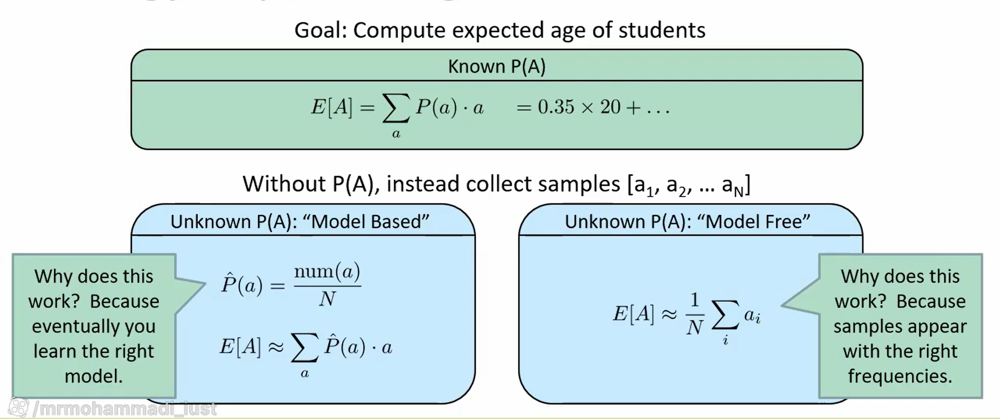
<center>Figure 3: Analogy: Expected Age, Adopted from [1]</center>
<br>

In model-free approaches there are multiple ideas:

#### Direct Evaluation: 

+ Goal: Compute values for each state under $\pi$
+ Idea: Average together observed sample values.
    + Act according to $\pi$
    + Every time we visit a state, write down what the sum of discounted reward turned out to be.
    + Then Average those samples

+ This is called direct evaluation

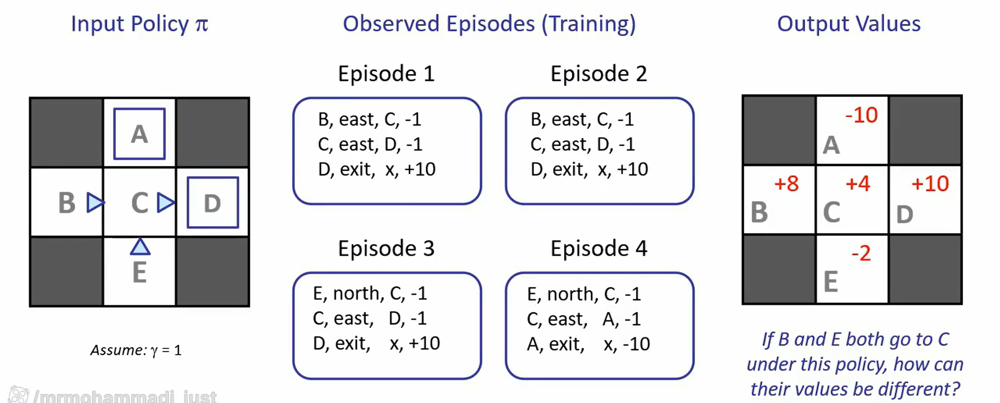
<center>Figure 4: Example: Direct Evaluation, Adopted from [1]</center>
<br>



+ What's good about direct evaluation:
    + It's easy to understand
    + It doesn't require any knowledge of T, R
    + It eventually computes the correct average values, using just sample transactions

+ What's bad about it:
    + It wastes information about state connections(it converges late and if the number of episode be small, that would lead to misvalued states)
    + Each state should be leanred separately
    + So, it takes a long time to learn

#### Temporal Difference Value Learning

For finding the value or utility of a state we shoudl wait till the end of the episode.

+ Simplified Bellman updates calculate $V$ for a fixed policy:
    + Each round, replace $V$ with one-step-look-ahead layer over $V$
    $$V_0^{\pi}(s) = 0$$
    $$V_{k+1}^{\pi} (s) \leftarrow \sum_{s'} T(s, \pi(s), s')[R(s, \pi(s), s') + \lambda V_k^{\pi}(s')]$$
    + This approach fully exploited the connections between the sates
    +  Unfortunately, we need T and R to do it!

+ Key question: how can we do this update to $V$ without knowing T and R?
    + In other words, how to we take a weighted average without knowing the weights?

> We should use our observations

+ We want to improve our estimate of $V$ by computing these averages:

$$V_{k+1}^{\pi} (s) \leftarrow \sum_{s'} T(s, \pi(s), s')[R(s, \pi(s), s') + \lambda V_k^{\pi}(s')]$$

+ Idea: Take samples of outcomes $s'$ (by doing the action!) and average

$$\text{sample}_1 = R(s, \pi(s), s'_1) + \lambda V_k^{\pi} (s_1')$$
$$\text{sample}_2 = R(s, \pi(s), s'_2) + \lambda V_k^{\pi} (s_2') \\ ...$$
$$\text{sample}_n = R(s, \pi(s), s'_n) + \lambda V_k^{\pi} (s_n')$$
$$V_{k+1}^{\pi} (s) \leftarrow \frac{1}{n} \sum_{i} \text{sample}_i$$

+ Big idea: learn from every experience!
    + Update $V(s)$ each time we experience a transaction $(s, a, r, s')$
    + Likely outcomes $s'$ will contribute updates more often

+ Temporal difference learning of values
    + Policy still fixed, still doing evaluation!
    + Move values toward value of whatever successor occcrus: running average.
    $$\text{Sample of V(s)}: \;\;\;\; \text{sample} = R(s, \pi(s), s') + \lambda V^{\pi}(s')$$
    $$\text{Update to V(s)}: \;\;\;\; V^{\pi} (s) \leftarrow (1 - \alpha)V^{\pi}(s) + (\alpha)\text{sample}$$
    $$\text{Same Update}: \;\;\;\; V^{\pi} (s) \leftarrow + \alpha(\text{sample} - V^{\pi}(s))$$

> The formula says that the value is the previous value but we add to it an $\alpha$ times the error($\text{sample} - V^{\pi}(s)$).


**Exponential Moving Average**

+ The running interpolation update: $\bar{x}_n = (1 - \alpha).\bar{x}_{n-1} + \alpha . x_n$
+ It makes recent samples more important 
+ Forget about the past(distant past values were wrong anyway)

> Decreasing learing rate ($\alpha$) can give converging averages.


Example of TD learning:

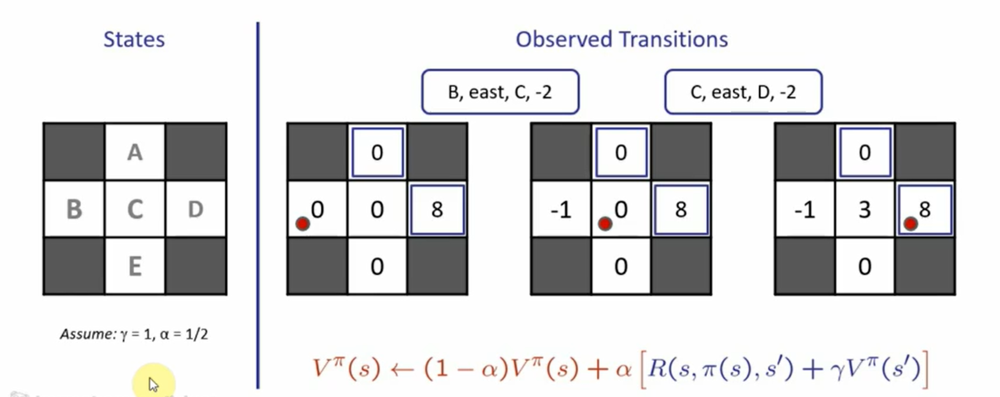
<center>Figure 5: Example of TD learning, Adopted from [1]</center>
<br>


+ TD values leaning is a model-free way to do policy evaluation, mimicking Bellman updates with running sample averages.
+ However, if we want to turn values into a (new) policy, we're sunk:
$$\pi(s) = \argmax_{a} Q(s, a)$$

Now we knew that:

$$Q(s, a) = \sum_{s'} T(s, a, s')[R(s, a, s') + \lambda V(s')]$$

In the equation above we only know $V$

So this approach that estimates the Value itself is not much helpful, because we do not know T and R<br>
Idea: learn Q-values, not values

+ Makes action selection model-free too

#### Q-Value Iteration

+ Value iteration: find successive (depth-limited) values
    + Start with $V_0(s) = 0$, which we know is right
    + Give $V_k$, calculate the depth $k+1$ values for all states:
    $$V_{k+1}(s) \leftarrow \max_{a} \sum_{s'} T(s, a, s')[R(s, a, s') + \lambda V_k(s')]$$

+ But Q-values are more useful, so compute them instead
    + Start with $Q_0(s, a) = 0$, which we know is right
    + Given $Q_k$, calculate the depth $k+1$ q-values for all q-state:
    $$Q_{k+1}(s, a) \leftarrow \sum_{s'} T(s, a, s')[R(s, a, s') + \lambda \max_{a'} Q_k(s', a')]$$

+ Q-Learning: sample-based Q-value iteration:
    $$Q_{k+1}(s, a) \leftarrow \sum_{s'} T(s, a, s')[R(s, a, s') + \lambda \max_{a'} Q_k(s', a')]$$

+ Learn $Q(s, a)$, values as we go.
    + Receive a sample (s, a, r, s') (it's anexperience)
    + Consider our old estimate: $Q(s, a)$
    + Cosider our new sample estimate: 
    $$\text{sample } = R(s, a, s') + \lambda \max_{a'} Q_k(s', a')$$
    + Incorporate the new estimate into a running average:
    $$Q(s, a) \leftarrow (1 - \alpha)Q(s, a) + \alpha [\text{sample}]$$

> In this way it's easier for us to pick and action for our policy. But the downfal of it is the increase of parameter to estimate.

**Q-Learning Properties**:

+ Q-Learning converges to optimal policy -- even if we're acting suboptimally
+ This is called **off-policy learning** (means that the policy we used for picking actions is not interfering witho our final optmal policy)

> Now this Q-Learning algorithm needs looots of experience to converge, which means that we have to explore enough.

+ We have to eventually make the learning rate small enough, but not decrease it too quickly

+ Basiclly, in the limit, it doesn't matter how we select actions

### Active RL

In Passive RL we had episodes and experiences and agent did not have to experice anything, here we want our agent to experience cause we do not have anything.

+ Full RL: optimal policies(like value iteration)
    + We don't know the transaction $T(s, a, s')$
    + We don't know the rewards $R(s, a, s')$
    + We choose the actionsnow
    + Goal: learn the optimal policy/ values

+ In this case:
    + Learner makes choises!
    + Fundamental tradeoff: exploitation vs. exploration
    + This is NOT offline planning! We actually take actions in the world and find out what happens.

**Exploration vs. Exploitation**:

How to Explore?
+ Several schemes for facing exploration
    + Simplest: random actions ($\epsilon$-greedy) -> It says that do a random action with a probability and exploit and do the optimal action now with some probability
        + Every time step, flip a coin
        + With (small) probability $\epsilon$, act randomly
        + With (large) probability $1-\epsilon$, act on current policy
    
    + Problems with random actions?
        + We do eventually explore the space, but keep thrashing around once learning is done
        + Once solution: lower $\epsilon$ over time
        + Another solution: exploration functions

#### Q-Learning 

**Pseudocode**:<br>
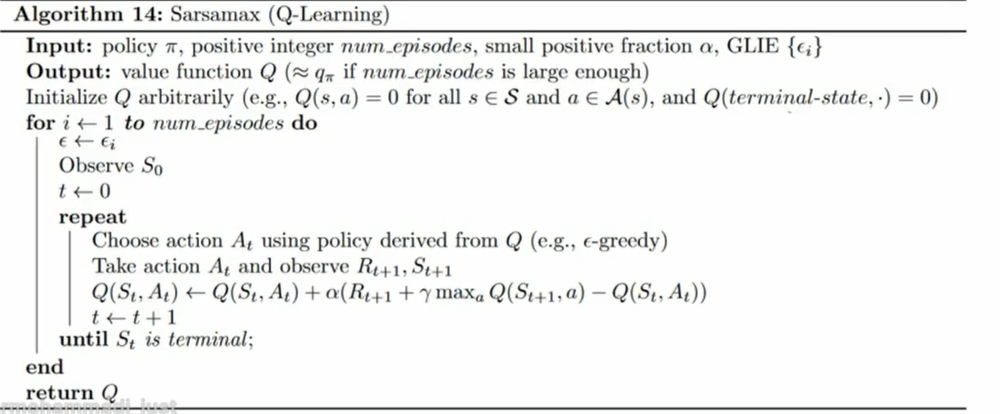
<center>Figure 6: Q-Learning Pseudocode, Adopted from [1]</center>
<br>

**Initializing Q**:

> What is the dimensionality of Q? 2D, number of states (S) and number of actions (A).<br>
Now consider that we have a 2D matrix for our Q values we set all of the matrix value to zero.


If we are using $\epsilon$-greedy method, with the chance of $\epsilon$ we **explore** (select the random action), and with the probability of $1 - \epsilon$ we woul choose an action that has the maximum $Q(s, a)$ which means that we **exploit** (select the greedy action).

> The value of $\epsilon$ decreases over time:

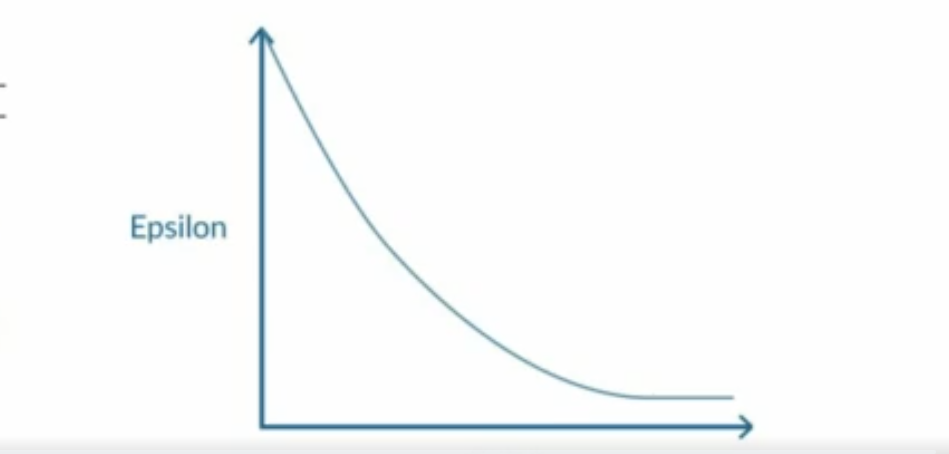
<center>Figure 7: Epsilon trend, Adopted from [1]</center>
<br>


$$\underbrace{Q(S_t, A_t)}_\text{New Q-value estimation} \leftarrow \underbrace{Q(S_t, A_t)}_\text{former Q-value estimation} + \underbrace{\alpha}_\text{Learning rate} \underbrace{[\underbrace{\underbrace{R_{t+1}}_\text{Immediate Reward} + \underbrace{\lambda \max_{a}Q(S_{t+1}, a)}_\text{Discounted Estimate optimal Q-value of next state}}_\text{TD Target} - \underbrace{Q(S_t, A_t)}_\text{Former Q-value estimation}]}_\text{TD Error}$$


+ To update $Q(S_t, A_t)$, we need $S_t$, $A_t$, $R_{t+1}$, $S_{t+1}$

+ We use $R_{t+1}$ and to get the best next-state-action pair value, we select with a greedy-policy (so not our epsilon greedy policy) the next best action.


**Off-policy vs On-policy**:<br>

RL algorithms divides into two parts based on the policy function that they use in learning/training time.

+ **Off-policy**: using a different policy for **acting** and **updating**. Like when they wanna choose an action they use $\epsilon$-greedy, but when they wanna update $Q$ they use another policy.
+ **On-policy**: using the same policy for acting and updating

**SARSA algorithm which is an On-policy RL algorithm**:

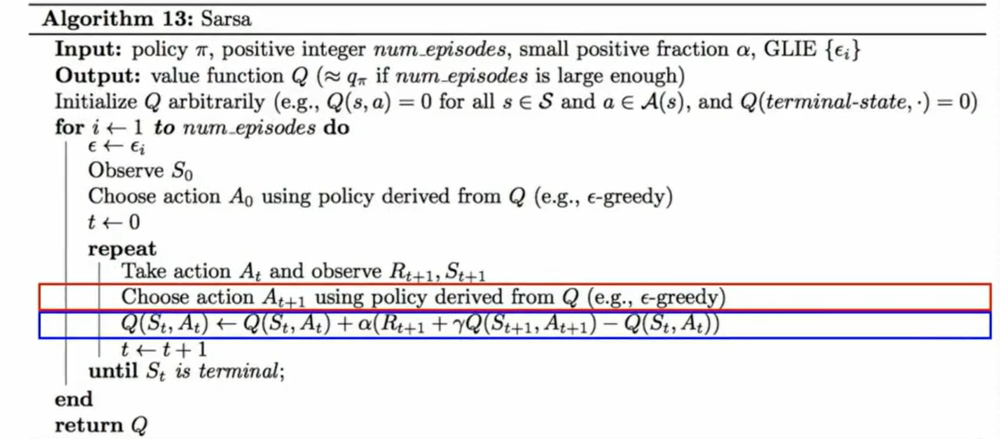
<center>Figure 8: SARSA pseudo code, Adopted [1]</center>
<br>

**What are their differences?**

Take the figure below:

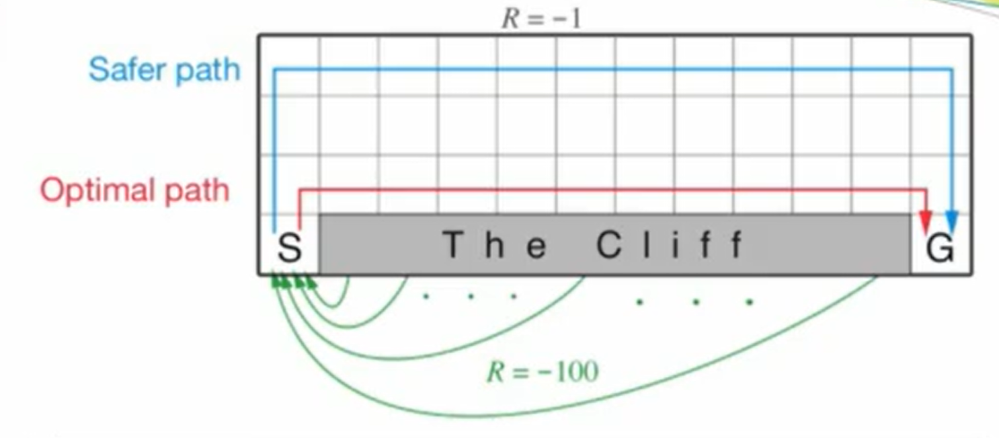
<center>Figure 9: Comparing between on-policy and off-policy, Adopted from [1]</center>
<br> 

If you look at the figure above, you can observe that we have two agent that one of them uses off-policy algorithm and the other one uses on-policy, now we wanna configure which is which.<br>
The blue agent did a more cautious approach which first moved a bit away vertically from the $S$(which has the most negative reward) and then proceed to get close to the state $G$(which is the goal state). The other agent took a risky but rather faster approach that did not moved away state $S$ too much and chose a faster way toward $G$. Now knowing off-policy and on-policy algorithms can you tell which one is which and why?<br>


So off-policy methods would reach to an optimal policy but with high risk approach, because for updating value of $Q$ it chooses the maximum one and this makes it more faster than the on-policy method.<br>
And the other one is on-policy algorithm(the blue agent).


 

##### Exploration Functions:

+ When to explore:
    + Random actions: explore a fixed amount
    + Better idea: explore areas whose badness is not (yet) established, eventually stop exploring

+ Exploration function:
    + Take a value estimate *u*(utility) and a visit count *n*, and returns an optimistic utility, e.g., $f(u, n) = u + \frac{k}{n}$
    + Regular Q-Update:     $Q(s, a) \leftarrow_{\alpha} R(s, a, s') + \lambda \max_{a'}Q(s', a')$
    + Modified Q-Update:     $Q(s, a) \leftarrow_{\alpha} R(s, a, s') + \lambda \max_{a'}f(Q(s', a'), N(s', a'))$

    + This propagetes the "bonus" back to states that lead to unknown states as well!

### Approximate Q-Learning 

**Generalizing Across States**:

+ Basic Q-Learning keeps a table of all q-values
+ In realistic situations, we cannot possibly learn about every signle state!
    + too many states to visit them all in training
    + Too many states to hold q-tables in memory

+ Instead we want to generalize:
    + Learn about some small number of training states from experience
    + Generalize that experience to new, similar situations
    + This is a fudamental idea in machine learning, and we'll see it over and over again

Example of lots of states and how some of them are like each other and we can generalize between them:

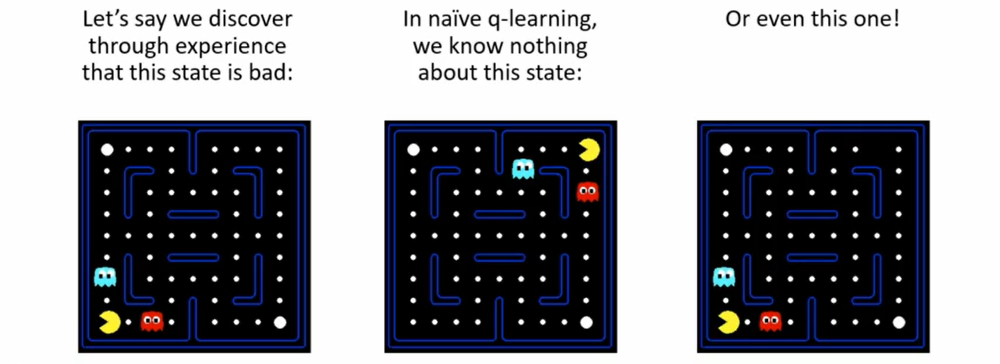
<center>Figure 10: Similarities of states, Adopted from [1]</center>
<br>

> Here we go to the feature-based representations.


##### Feature-Based Representations 

It says that instead of considering a value for each single state, do a description for your states and then give the *description* a value.(mind blowing huh!!!).<br>
Means that describe each state using descrete number of features.

+ Solution: describe a state using a vector of features(properties)
    + Features are functions from states to real numbers (often 0/1) that capture important properties of the state.
    + Example of a feature in pacman game:
        + Distance to closest ghost
        + Distance to closest dot
        + Number of ghosts
        + 1 / (dist to dot)^2
        + Is pacman in a tunner? (0/1)
        + ......etc.
    + Can also describe a q-state (s, a) with features (e.g, action moves closer to food)

#### Linear Value Functions

+ Using a feature representation, we can write a $q$ function (or value function) for any state using a few weights:
$$V(s) = w_1f_1(s) + w_2f_2(s) + ... + w_nf_n(s)$$
$$Q(s, a) = w_1 f_1(s, a) + w_2 f_2(s, a) + ... + w_n f_n(s,a)$$

+ Advantage: our experience is summed up in a few powerful numbers  
+ Disadvantage: state may share features but actually be very different value! (which means that we should use good features and models)


$$Q(s, a) = w_1 f_1(s, a) + w_2 f_2(s, a) + ... + w_n f_n(s,a)$$
+ Q-learning with linear Q-functions:   
    + transition = $(s, a, r, s')$
    + difference = $[r + \lambda \max_{a'} Q(s', a')] - Q(s, a)$
    $$Q(s, a) \leftarrow Q(s, a) + \alpha [\text{difference}]$$

    + We wanna choose parameters in a way that minimizes the difference:

    $$w_i \leftarrow w_i + \alpha[\text{difference}] f_i(s, a)$$

+ Intuitive interpretation: 
    + Adjust weights of active features
    + e.g., if something unexpectedly bad happens, blame the features that were on: disprefer all states with that state's features

+ Formal justification: online least squares


Example:


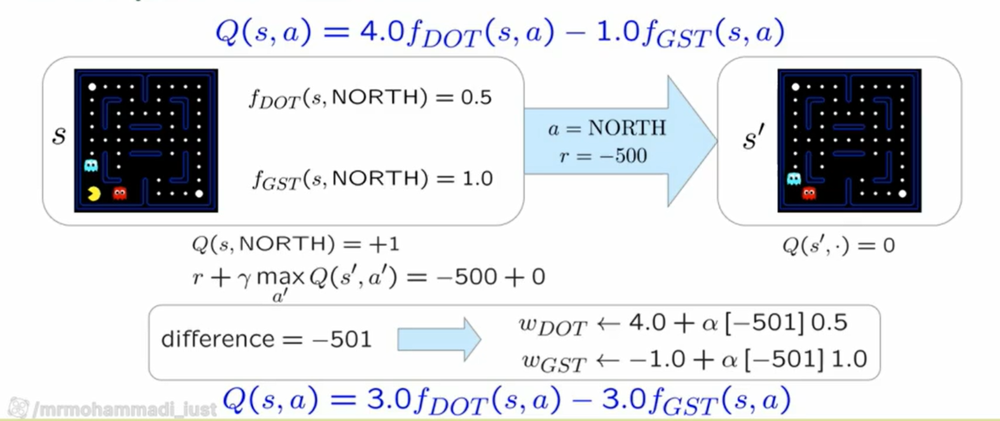
<center>Figure 11: Example of linear value function, Adopted from [1]</center>
<br>

> Not only the value of this state-action changed but also all the values of state-actions changed.


### Deep Q-learning

It's idea is the sames as the approximation Q-learning.

### Resources:

[1] [Introduction to AI, CS 188, UC Berkeley](https://inst.eecs.berkeley.edu/~cs188/su25/)<br>
[2] [Introduction to AI, Dr.Mohammadi's video](https://www.aparat.com/v/t35t0v1)